In [1]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)                          # Unfolding hidden features if the cardinality is high
pd.set_option('display.max_colwidth', None)                         # Unfolding the max feature width for better clearity
pd.set_option('display.max_rows', None)                             # Unfolding hidden data points if the cardinality is high
pd.set_option('mode.chained_assignment', None)                      # Removing restriction over chained assignments operations
pd.set_option('display.float_format', lambda x: '%.5f' % x)  

import re
import missingno as msno

from pandas_profiling import ProfileReport

# For Random seed values
from random import randint

# For Data Visualization
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
%matplotlib inline
import seaborn as sns

# For Preprocessing
import sklearn as sk

# For Data Modeling
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder

# For metrics evaluation
from sklearn.metrics import accuracy_score,roc_auc_score, precision_recall_curve, classification_report, confusion_matrix, ConfusionMatrixDisplay
# To Disable Warnings
import warnings
warnings.filterwarnings("ignore")

/var/folders/yx/7fb8cgrd7_7c1vxtf73slfvr0000gn/T/ipykernel_40954/2920190952.py:12: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [2]:
df = pd.read_csv("existing_base_train.csv")
df.shape

(8124, 32)

In [3]:
df.head()

,REF_NO,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,TVarea,post_code,post_area,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,gender,region,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance,Revenue_Grid
0,5466,2,31-35,Partner,Professional,Professional,Own Home,">=35,000",No,No,1981,Meridian,M51 0GU,M51,26.98000,29.99000,312.25000,299.79000,88.72000,108.85000,175.43000,134.35000,8.98000,55.44000,7.68000,Female,North West,151.55000,81.79000,136.02000,360.37000,2
1,9091,Zero,45-50,Partner,Secretarial/Admin,Professional,Own Home,">=35,000",No,No,1997,Meridian,L40 2AG,L40,35.98000,74.48000,0.00000,99.96000,10.99000,48.45000,15.99000,0.00000,0.00000,0.00000,18.99000,Female,North West,44.28000,13.91000,29.23000,89.22000,2
2,9744,1,36-40,Partner,Manual Worker,Manual Worker,Rent Privately,"<22,500, >=20,000",Yes,Yes,1996,HTV,TA19 9PT,TA19,0.00000,24.46000,0.00000,18.44000,0.00000,0.00000,0.02000,10.46000,0.00000,0.00000,0.00000,Female,South West,8.58000,1.75000,4.82000,14.50000,2
3,10700,2,31-35,Partner,Manual Worker,Manual Worker,Own Home,"<25,000, >=22,500",No,No,1990,Scottish TV,FK2 9NG,FK2,44.99000,0.00000,0.00000,0.00000,29.99000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,Female,Scotland,15.00000,0.00000,5.00000,68.98000,2
4,1987,Zero,55-60,Partner,Housewife,Professional,Own Home,">=35,000",No,No,1989,Yorkshire,LS23 7DJ,LS23,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,9.98000,0.00000,0.00000,0.00000,Female,Unknown,0.00000,1.66000,1.66000,1.88000,2


In [4]:
df.columns

Index(['REF_NO', 'children', 'age_band', 'status', 'occupation',
       'occupation_partner', 'home_status', 'family_income', 'self_employed',
       'self_employed_partner', 'year_last_moved', 'TVarea', 'post_code',
       'post_area', 'Average_Credit_Card_Transaction', 'Balance_Transfer',
       'Term_Deposit', 'Life_Insurance', 'Medical_Insurance',
       'Average_A/C_Balance', 'Personal_Loan', 'Investment_in_Mutual_Fund',
       'Investment_Tax_Saving_Bond', 'Home_Loan', 'Online_Purchase_Amount',
       'gender', 'region', 'Investment_in_Commudity', 'Investment_in_Equity',
       'Investment_in_Derivative', 'Portfolio_Balance', 'Revenue_Grid'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 32 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   REF_NO                           8124 non-null   int64  
 1   children                         8124 non-null   object 
 2   age_band                         8124 non-null   object 
 3   status                           8124 non-null   object 
 4   occupation                       8124 non-null   object 
 5   occupation_partner               8124 non-null   object 
 6   home_status                      8124 non-null   object 
 7   family_income                    8124 non-null   object 
 8   self_employed                    8124 non-null   object 
 9   self_employed_partner            8124 non-null   object 
 10  year_last_moved                  8124 non-null   int64  
 11  TVarea                           8124 non-null   object 
 12  post_code           

In [6]:
df.describe()

,REF_NO,year_last_moved,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance,Revenue_Grid
count,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000,8124.00000
mean,5797.34330,1967.87691,23.25109,46.08292,27.28465,65.31794,18.82620,31.83802,25.41583,41.72363,6.05725,4.41691,19.19866,36.15275,21.44248,31.53065,89.35337,1.89414
std,3322.49757,182.56379,51.14750,79.08469,54.13354,95.76245,32.02233,45.24944,85.13015,64.41602,12.67337,9.94575,92.34313,42.47495,32.26166,39.48066,108.30354,0.30768
min,2.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,-78.43000,1.00000
25%,2924.75000,1978.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,8.28250,4.66000,8.74000,26.27750,2.00000
50%,5811.50000,1988.00000,0.00000,17.48500,0.00000,31.47500,0.01000,14.98000,0.00000,23.48000,0.00000,0.00000,0.00000,23.59000,12.82000,21.14000,65.56000,2.00000
75%,8681.50000,1994.00000,23.48000,64.99000,34.49000,92.88750,26.97000,45.92250,20.82750,59.44000,5.49000,4.49000,7.48000,49.79500,27.97250,42.39250,123.97000,2.00000
max,11518.00000,1999.00000,662.26000,2951.76000,784.82000,2930.41000,591.04000,626.24000,4905.93000,2561.27000,156.87000,162.35000,4306.42000,1231.09000,1279.10000,1771.16000,4283.56000,2.00000


In [52]:
df.skew()

REF_NO                             -0.01280
children                            1.18339
year_last_moved                   -10.63967
Average_Credit_Card_Transaction     3.76115
Balance_Transfer                    8.17373
Term_Deposit                        4.17416
Life_Insurance                      5.50938
Medical_Insurance                   3.36194
Average_A/C_Balance                 2.68999
Personal_Loan                      26.15960
Investment_in_Mutual_Fund           9.66725
Investment_Tax_Saving_Bond          3.19171
Home_Loan                           3.97766
Online_Purchase_Amount             21.76395
Investment_in_Commudity             4.81612
Investment_in_Equity               11.52491
Investment_in_Derivative           12.46231
Portfolio_Balance                   8.89547
Revenue_Grid                       -2.56268
dtype: float64

In [7]:
df.corr()

,REF_NO,year_last_moved,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance,Revenue_Grid
REF_NO,1.00000,0.02615,-0.00322,-0.00660,0.00385,0.01088,0.01981,-0.00366,-0.00830,-0.00386,0.00636,-0.01663,0.00451,0.00564,-0.00407,0.00269,0.00276,-0.01985
year_last_moved,0.02615,1.00000,0.01432,0.01327,0.00620,0.01029,0.01297,0.00794,0.01726,0.00085,0.01340,0.00649,0.01072,0.01657,0.01606,0.01458,0.01792,-0.01963
Average_Credit_Card_Transaction,-0.00322,0.01432,1.00000,0.12276,0.31761,0.14261,0.41677,0.17815,0.08936,0.14744,0.13164,0.10342,0.13547,0.49465,0.20856,0.22727,0.33466,-0.26056
Balance_Transfer,-0.00660,0.01327,0.12276,1.00000,0.22543,0.57927,0.16210,0.36448,0.39047,0.47606,0.15248,0.15532,0.10324,0.74505,0.48256,0.60365,0.65552,-0.06865
Term_Deposit,0.00385,0.00620,0.31761,0.22543,1.00000,0.27780,0.50906,0.27455,0.14151,0.20084,0.18159,0.17914,0.10234,0.61736,0.26317,0.34875,0.45195,-0.01741
Life_Insurance,0.01088,0.01029,0.14261,0.57927,0.27780,1.00000,0.23183,0.50788,0.41119,0.55793,0.25775,0.28134,0.11784,0.80673,0.57277,0.84589,0.79284,-0.20200
Medical_Insurance,0.01981,0.01297,0.41677,0.16210,0.50906,0.23183,1.00000,0.26683,0.10173,0.20228,0.21521,0.14490,0.14932,0.54581,0.26720,0.38295,0.43358,-0.10222
Average_A/C_Balance,-0.00366,0.00794,0.17815,0.36448,0.27455,0.50788,0.26683,1.00000,0.19347,0.43774,0.30256,0.37756,0.16030,0.51785,0.58020,0.63715,0.59986,-0.11426
Personal_Loan,-0.00830,0.01726,0.08936,0.39047,0.14151,0.41119,0.10173,0.19347,1.00000,0.42430,0.22401,0.12536,0.07982,0.40374,0.68540,0.70367,0.61826,0.02284
Investment_in_Mutual_Fund,-0.00386,0.00085,0.14744,0.47606,0.20084,0.55793,0.20228,0.43774,0.42430,1.00000,0.25340,0.25445,0.09196,0.54605,0.69524,0.77448,0.70438,-0.11002


In [55]:
df.occupation.value_counts()

Professional         1949
Retired              1799
Secretarial/Admin    1435
Housewife             984
Business Manager      578
Manual Worker         451
Unknown               449
Other                 432
Student                47
Name: occupation, dtype: int64

In [57]:
profile = ProfileReport(df) 
profile.to_file("customClassificationProfileReport.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
for col in df.columns:
    if df[col].dtype=='object':
        print(col)
        print(df[col].value_counts())

children
Zero    4991
1       1474
2       1271
3        375
4+        13
Name: children, dtype: int64
age_band
45-50      1098
41-45       903
36-40       895
55-60       865
31-35       840
51-55       833
26-30       735
61-65       700
65-70       468
22-25       356
71+         337
18-21        50
Unknown      44
Name: age_band, dtype: int64
status
Partner                 6124
Single/Never Married     881
Divorced/Separated       569
Widowed                  510
Unknown                   40
Name: status, dtype: int64
occupation
Professional         1949
Retired              1799
Secretarial/Admin    1435
Housewife             984
Business Manager      578
Manual Worker         451
Unknown               449
Other                 432
Student                47
Name: occupation, dtype: int64
occupation_partner
Unknown              1942
Professional         1620
Retired              1558
Manual Worker        1222
Business Manager      575
Secretarial/Admin     510
Housewife            

In [10]:
df["region"].value_counts()

South East          1680
North West          1517
Unknown              866
South West           769
West Midlands        658
East Midlands        623
Scotland             615
North                460
Wales                437
East Anglia          344
Northern Ireland     135
Isle of Man           15
Channel Islands        5
Name: region, dtype: int64

In [ ]:
for col in df.columns:
    if df[col].dtype=='object':
        fig, ax = plt.subplots(figsize=(20,10))
        df[col].value_counts().plot.bar(ax=ax)
        plt.show()


Index(['REF_NO', 'children', 'age_band', 'status', 'occupation',
       'occupation_partner', 'home_status', 'family_income', 'self_employed',
       'self_employed_partner', 'year_last_moved', 'TVarea', 'post_code',
       'post_area', 'Average_Credit_Card_Transaction', 'Balance_Transfer',
       'Term_Deposit', 'Life_Insurance', 'Medical_Insurance',
       'Average_A/C_Balance', 'Personal_Loan', 'Investment_in_Mutual_Fund',
       'Investment_Tax_Saving_Bond', 'Home_Loan', 'Online_Purchase_Amount',
       'gender', 'region', 'Investment_in_Commudity', 'Investment_in_Equity',
       'Investment_in_Derivative', 'Portfolio_Balance', 'Revenue_Grid'],
      dtype='object')

In [12]:
df.children = df.children.replace("Zero", int(0))
df.children.value_counts()

0     4991
1     1474
2     1271
3      375
4+      13
Name: children, dtype: int64

In [13]:
df.children = df.children.replace("4+", int(4))

In [14]:
df.children = pd.to_numeric(df.children)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8124 entries, 0 to 8123
Data columns (total 32 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   REF_NO                           8124 non-null   int64  
 1   children                         8124 non-null   int64  
 2   age_band                         8124 non-null   object 
 3   status                           8124 non-null   object 
 4   occupation                       8124 non-null   object 
 5   occupation_partner               8124 non-null   object 
 6   home_status                      8124 non-null   object 
 7   family_income                    8124 non-null   object 
 8   self_employed                    8124 non-null   object 
 9   self_employed_partner            8124 non-null   object 
 10  year_last_moved                  8124 non-null   int64  
 11  TVarea                           8124 non-null   object 
 12  post_code           

In [16]:
df[['Life_Insurance', 'Revenue_Grid']].corr()

,Life_Insurance,Revenue_Grid
Life_Insurance,1.00000,-0.20200
Revenue_Grid,-0.20200,1.00000


<AxesSubplot:>

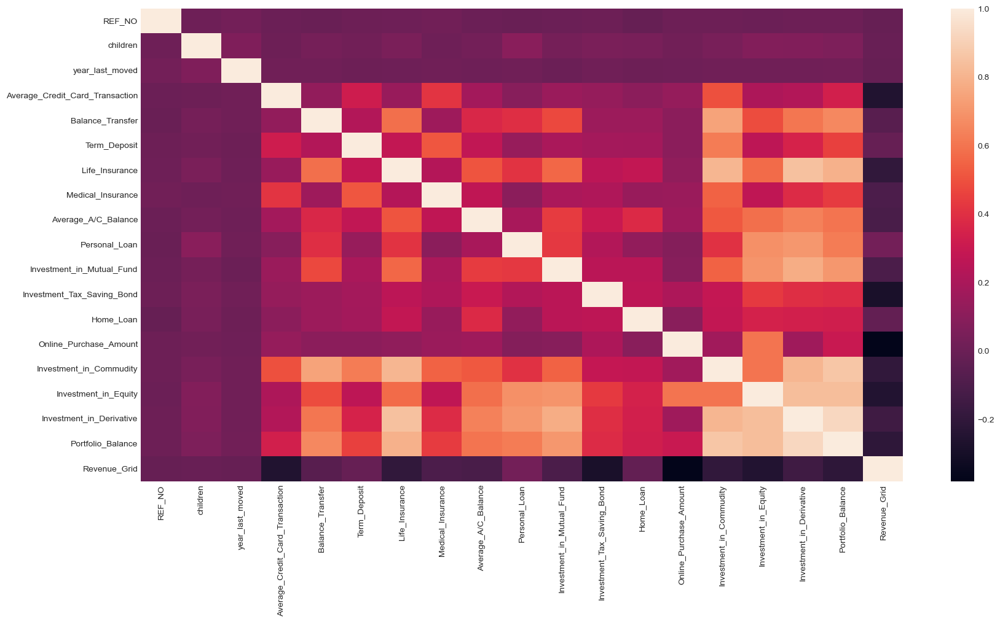

In [51]:
fg, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(data= df.corr(), ax=ax)

In [17]:
X_train = df.drop('Revenue_Grid', axis=1)
y_train = df['Revenue_Grid']
label_encoding = LabelEncoder()

In [18]:
for x in X_train.columns:
     if X_train[x].dtype == 'object':
        X_train[x] = label_encoding.fit_transform(X_train[x])

In [19]:
X_train.corr()

,REF_NO,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,TVarea,post_code,post_area,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,gender,region,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance
REF_NO,1.00000,0.00978,-0.00566,-0.01080,-0.01399,-0.00552,-0.01038,-0.01509,0.00310,-0.00704,0.02615,0.00183,-0.01222,-0.01265,-0.00322,-0.00660,0.00385,0.01088,0.01981,-0.00366,-0.00830,-0.00386,0.00636,-0.01663,0.00451,0.01442,0.00445,0.00564,-0.00407,0.00269,0.00276
children,0.00978,1.00000,-0.41973,-0.17708,-0.14237,-0.21243,-0.03367,0.24496,0.05349,0.11582,0.06196,-0.01231,-0.02910,-0.02940,0.00596,0.02843,0.01853,0.04727,0.00844,0.02390,0.09686,0.03066,0.04954,0.03969,0.02202,-0.01145,0.00487,0.03933,0.07418,0.07062,0.05886
age_band,-0.00566,-0.41973,1.00000,0.15459,0.16468,0.18484,0.10016,-0.40677,-0.03865,-0.09623,-0.11044,0.02596,0.01060,0.01092,-0.03608,-0.03202,-0.02595,-0.03954,-0.02486,-0.03436,-0.08677,-0.04293,-0.04905,-0.04345,-0.02777,0.06287,0.04007,-0.04881,-0.07917,-0.07139,-0.06802
status,-0.01080,-0.17708,0.15459,1.00000,0.07466,0.26402,0.10366,-0.20334,-0.02468,-0.06751,-0.10053,-0.00345,0.01016,0.01021,0.01244,-0.01650,-0.00410,-0.01732,-0.01450,0.00000,-0.03399,-0.00453,-0.02195,-0.01771,-0.01698,-0.04089,-0.00149,-0.01419,-0.02690,-0.02358,-0.02273
occupation,-0.01399,-0.14237,0.16468,0.07466,1.00000,0.16880,0.05776,-0.10608,0.11003,-0.00966,-0.09805,0.01006,0.01849,0.01822,-0.00001,-0.01607,-0.00420,-0.00365,-0.00054,-0.01159,-0.02314,-0.00773,-0.02277,-0.00450,-0.00525,-0.03324,-0.00188,-0.00879,-0.01969,-0.01540,-0.01299
occupation_partner,-0.00552,-0.21243,0.18484,0.26402,0.16880,1.00000,0.07896,-0.28623,0.00965,0.00455,-0.07830,-0.00750,-0.00242,-0.00265,-0.00910,-0.01017,-0.00332,-0.01344,-0.00567,0.00199,-0.04011,-0.00200,-0.01036,-0.00490,-0.01332,-0.02148,0.00434,-0.01374,-0.02513,-0.02133,-0.01576
home_status,-0.01038,-0.03367,0.10016,0.10366,0.05776,0.07896,1.00000,-0.16659,-0.03374,-0.04038,-0.29603,0.01812,0.00219,0.00241,-0.00817,0.00621,-0.00851,-0.00722,-0.01996,0.00071,-0.02100,-0.00142,-0.00248,-0.00016,-0.00652,-0.03859,-0.00724,-0.00809,-0.01283,-0.01355,-0.01470
family_income,-0.01509,0.24496,-0.40677,-0.20334,-0.10608,-0.28623,-0.16659,1.00000,0.11777,0.10417,-0.05928,-0.07568,-0.00587,-0.00533,0.02409,0.03336,0.03088,0.04554,0.03870,0.02917,0.09675,0.03260,0.05089,0.03013,0.02309,0.12557,-0.03724,0.05247,0.07611,0.07557,0.07014
self_employed,0.00310,0.05349,-0.03865,-0.02468,0.11003,0.00965,-0.03374,0.11777,1.00000,0.24065,0.01208,-0.03739,0.00500,0.00540,-0.00406,0.01177,-0.01131,0.01717,-0.00413,0.00349,0.01946,-0.00212,0.00385,0.01964,-0.00482,0.11049,0.00304,0.00764,0.00763,0.01367,0.01031
self_employed_partner,-0.00704,0.11582,-0.09623,-0.06751,-0.00966,0.00455,-0.04038,0.10417,0.24065,1.00000,0.02936,-0.02054,-0.00610,-0.00641,0.00023,0.00682,0.00537,0.02772,0.00320,0.01180,0.02709,0.00242,0.01099,0.03835,0.00857,-0.10826,-0.01070,0.01695,0.02226,0.02488,0.01804


In [20]:
X_train[['post_code', 'region']].corr()

,post_code,region
post_code,1.00000,-0.09059
region,-0.09059,1.00000


In [21]:
X_train

,REF_NO,children,age_band,status,occupation,occupation_partner,home_status,family_income,self_employed,self_employed_partner,year_last_moved,TVarea,post_code,post_area,Average_Credit_Card_Transaction,Balance_Transfer,Term_Deposit,Life_Insurance,Medical_Insurance,Average_A/C_Balance,Personal_Loan,Investment_in_Mutual_Fund,Investment_Tax_Saving_Bond,Home_Loan,Online_Purchase_Amount,gender,region,Investment_in_Commudity,Investment_in_Equity,Investment_in_Derivative,Portfolio_Balance
0,5466,2,3,1,4,4,1,11,0,0,1981,7,4628,1083,26.98000,29.99000,312.25000,299.79000,88.72000,108.85000,175.43000,134.35000,8.98000,55.44000,7.68000,0,5,151.55000,81.79000,136.02000,360.37000
1,9091,0,6,1,6,4,1,11,0,0,1997,7,3768,930,35.98000,74.48000,0.00000,99.96000,10.99000,48.45000,15.99000,0.00000,0.00000,0.00000,18.99000,0,5,44.28000,13.91000,29.23000,89.22000
2,9744,1,4,1,2,2,2,7,1,1,1996,6,7044,1686,0.00000,24.46000,0.00000,18.44000,0.00000,0.00000,0.02000,10.46000,0.00000,0.00000,0.00000,0,9,8.58000,1.75000,4.82000,14.50000
3,10700,2,3,1,2,2,1,8,0,0,1990,8,2439,618,44.99000,0.00000,0.00000,0.00000,29.99000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0,7,15.00000,0.00000,5.00000,68.98000
4,1987,0,8,1,1,4,1,11,0,0,1989,13,4222,1027,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,9.98000,0.00000,0.00000,0.00000,0,10,0.00000,1.66000,1.66000,1.88000
5,3309,0,6,1,6,0,1,11,0,0,1984,11,819,203,9.49000,0.01000,0.00000,0.51000,55.89000,0.00000,28.98000,0.00000,0.00000,0.00000,0.00000,0,6,13.18000,4.83000,14.23000,33.62000
6,6610,0,4,1,6,6,1,10,1,0,1986,3,147,47,9.99000,0.00000,0.00000,0.00000,0.00000,26.96000,22.99000,80.42000,1.00000,3.99000,5.49000,0,12,2.00000,23.48000,21.90000,13.12000
7,10621,0,9,1,5,5,1,6,0,0,1998,5,6004,1433,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,29.95000,0.00000,0.00000,0.00000,1,5,0.00000,4.99000,4.99000,15.74000
8,2630,1,6,1,4,4,1,11,0,0,1980,12,1058,267,0.00000,82.96000,0.00000,40.47000,12.49000,0.00000,28.97000,0.00000,0.00000,0.00000,0.00000,0,10,27.18000,4.83000,13.66000,36.05000
9,9356,3,4,1,4,1,1,9,1,0,1997,7,4352,1044,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,15.99000,0.00000,24.47000,0.00000,0.00000,1,5,0.00000,6.74000,6.74000,8.60000


In [22]:
model = LogisticRegression()
model.fit(X_train,y_train)

LogisticRegression()

In [23]:
y_train_pred = model.predict(X_train)

In [24]:
accuracy_score(y_train, y_train_pred)

0.9453471196454948

In [25]:
from sklearn.metrics import classification_report
print(classification_report(y_train, y_train_pred))

              precision    recall  f1-score   support

           1       0.85      0.58      0.69       860
           2       0.95      0.99      0.97      7264

    accuracy                           0.95      8124
   macro avg       0.90      0.79      0.83      8124
weighted avg       0.94      0.95      0.94      8124



In [26]:
test_data = pd.read_csv("existing_base_test.csv")
test_data.shape

(2031, 31)

In [27]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2031 entries, 0 to 2030
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   REF_NO                           2031 non-null   int64  
 1   children                         2031 non-null   object 
 2   age_band                         2031 non-null   object 
 3   status                           2031 non-null   object 
 4   occupation                       2031 non-null   object 
 5   occupation_partner               2031 non-null   object 
 6   home_status                      2031 non-null   object 
 7   family_income                    2031 non-null   object 
 8   self_employed                    2031 non-null   object 
 9   self_employed_partner            2031 non-null   object 
 10  year_last_moved                  2031 non-null   int64  
 11  TVarea                           2031 non-null   object 
 12  post_code           

In [28]:
for col in test_data.columns:
    if test_data[col].dtype == 'object':
        print(col)
        print(test_data[col].value_counts())

children
Zero    1217
1        374
2        336
3         98
4+         6
Name: children, dtype: int64
age_band
45-50      261
36-40      239
31-35      221
51-55      219
41-45      209
26-30      192
55-60      182
61-65      181
65-70      130
22-25      100
71+         73
18-21       13
Unknown     11
Name: age_band, dtype: int64
status
Partner                 1585
Single/Never Married     220
Divorced/Separated       110
Widowed                  108
Unknown                    8
Name: status, dtype: int64
occupation
Professional         500
Retired              407
Secretarial/Admin    362
Housewife            271
Business Manager     154
Unknown              118
Other                105
Manual Worker        105
Student                9
Name: occupation, dtype: int64
occupation_partner
Unknown              452
Professional         431
Retired              378
Manual Worker        286
Business Manager     162
Secretarial/Admin    152
Housewife            105
Other                 63

In [29]:
test_data.children = test_data.children.replace("Zero", 0)
test_data.children = test_data.children.replace("4+", 4)


In [30]:
test_data.children.value_counts()

0    1217
1     374
2     336
3      98
4       6
Name: children, dtype: int64

In [31]:
test_data.children = pd.to_numeric(test_data.children)
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2031 entries, 0 to 2030
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   REF_NO                           2031 non-null   int64  
 1   children                         2031 non-null   int64  
 2   age_band                         2031 non-null   object 
 3   status                           2031 non-null   object 
 4   occupation                       2031 non-null   object 
 5   occupation_partner               2031 non-null   object 
 6   home_status                      2031 non-null   object 
 7   family_income                    2031 non-null   object 
 8   self_employed                    2031 non-null   object 
 9   self_employed_partner            2031 non-null   object 
 10  year_last_moved                  2031 non-null   int64  
 11  TVarea                           2031 non-null   object 
 12  post_code           

In [33]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2031 entries, 0 to 2030
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   REF_NO                           2031 non-null   int64  
 1   children                         2031 non-null   int64  
 2   age_band                         2031 non-null   object 
 3   status                           2031 non-null   object 
 4   occupation                       2031 non-null   object 
 5   occupation_partner               2031 non-null   object 
 6   home_status                      2031 non-null   object 
 7   family_income                    2031 non-null   object 
 8   self_employed                    2031 non-null   object 
 9   self_employed_partner            2031 non-null   object 
 10  year_last_moved                  2031 non-null   int64  
 11  TVarea                           2031 non-null   object 
 12  post_code           

In [35]:
for x in test_data.columns:
     if test_data[x].dtype == 'object':
        test_data[x] = label_encoding.fit_transform(test_data[x])

In [37]:
test_predict = model.predict(test_data)

In [39]:
csvdata = pd.DataFrame()
csvdata['REF_NO'] = test_data['REF_NO']
csvdata['Predicted_rev'] = test_predict

In [40]:
csvdata

,REF_NO,Predicted_rev
0,697,2
1,7897,2
2,4729,2
3,6914,2
4,2795,2
5,7367,2
6,9598,2
7,6704,2
8,4933,2
9,9880,2


In [41]:
csvdata.to_csv("sample.csv",index=False, header=False)